In [1]:
import cv2
import numpy as np
from superpoint.datasets.coco import Coco
from utils import plot_imgs

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [125]:
config = {
    'labels': 'outputs/magic-point_synth-120-160_noise-motion_coco_homography-1_num-1000_fcnt-10',
    'truncate': 50,
    'augmentation' : {
        'enable': True,
        'primitives': [
            'additive_gaussian_noise',
            'motion_blur',
            'additive_speckle_noise',
            'add_shade',
            'random_brightness',
            'random_contrast',
            'elastic_transform'],
        'params': {
            'motion_blur': {'ksize': 7},
            'additive_gaussian_noise': {'std': [3, 5]},
            'additive_speckle_noise': {'intensity': 1},
            'random_brightness': {'max_change': 50},
            'random_contrast': {'max_change': [0.5, 1.7]},
            'add_shade': {'transparency': 0.4},
            'elastic_transform': {'sigma_params': [0.05, 0.05], 'alpha_params': [0.5, 0.5], 'padding': 2},
        }
    }
}
dataset = Coco(**config)
data = dataset.get_training_set()
add_keypoints = True

In [126]:
def draw_keypoints(img, corners, color, s = 3):
    keypoints = [cv2.KeyPoint(c[1]*s, c[0]*s, 1) for c in np.stack(corners).T]
    img = cv2.resize(img, None, fx=s, fy=s)
    return cv2.drawKeypoints(img.astype(np.uint8), keypoints, None, color=color)
def display(d):
    im = d['image'][..., 0]
    return draw_keypoints(im, np.where(d['keypoint_map']), (0, 255, 0)) if add_keypoints else im

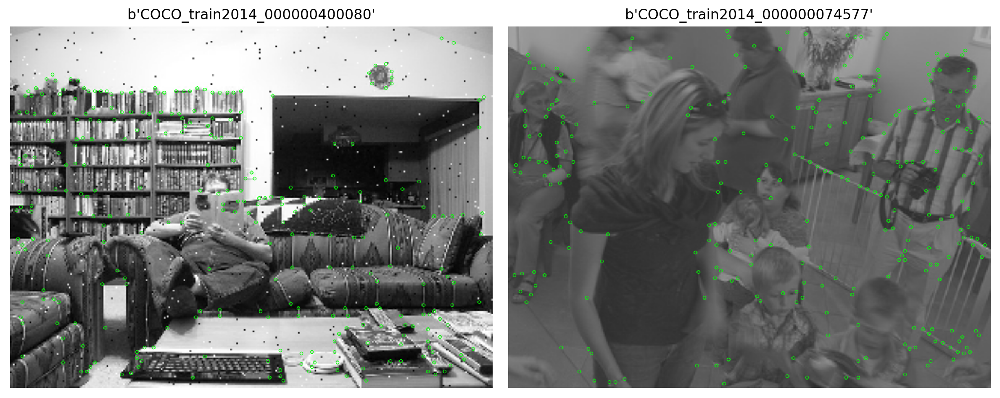

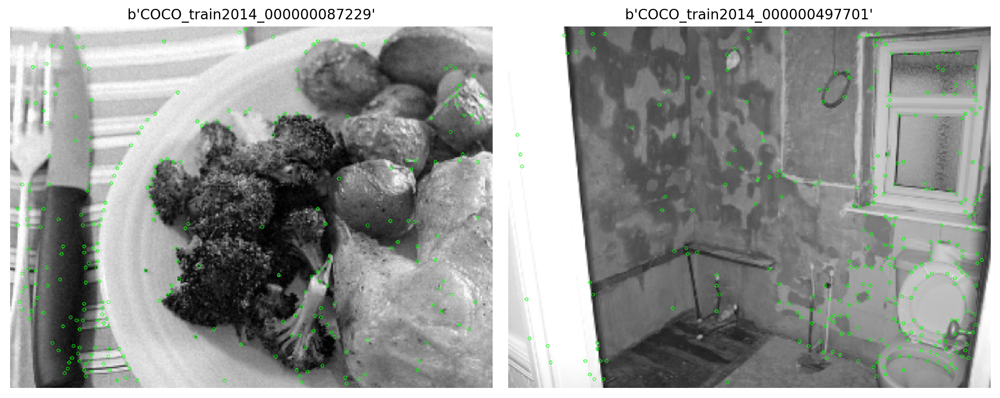

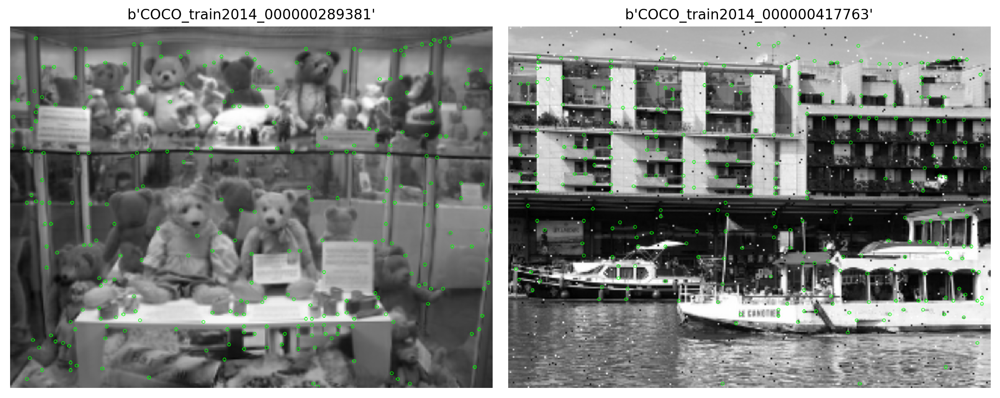

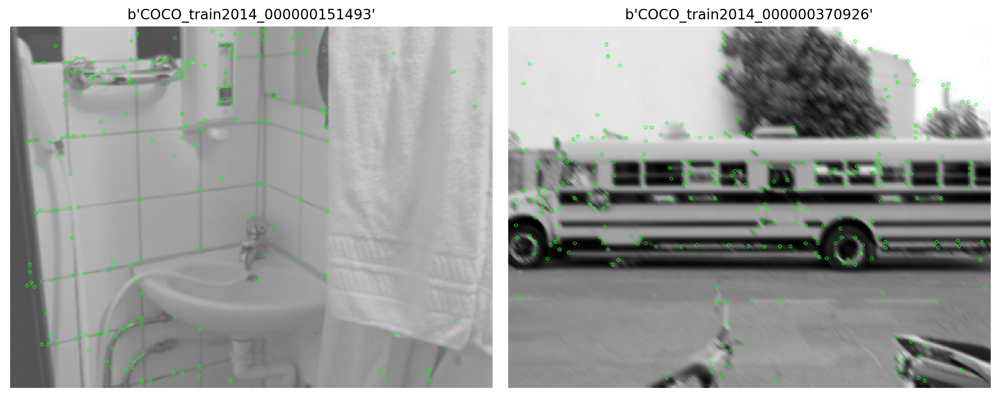

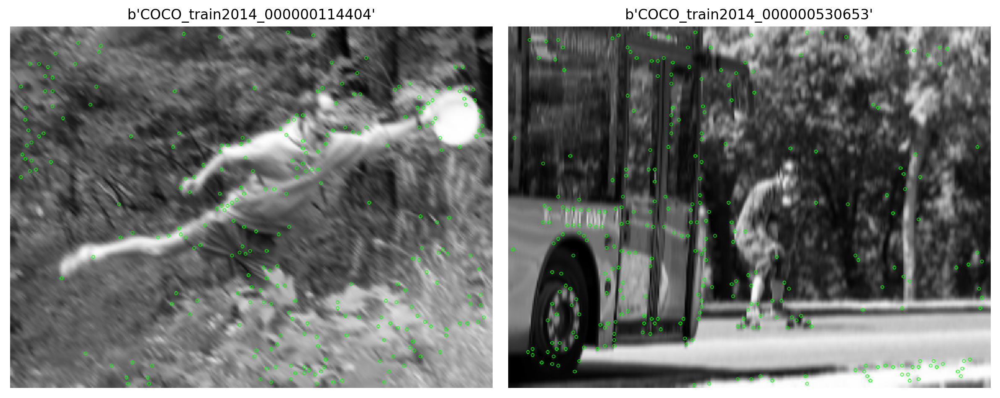

...

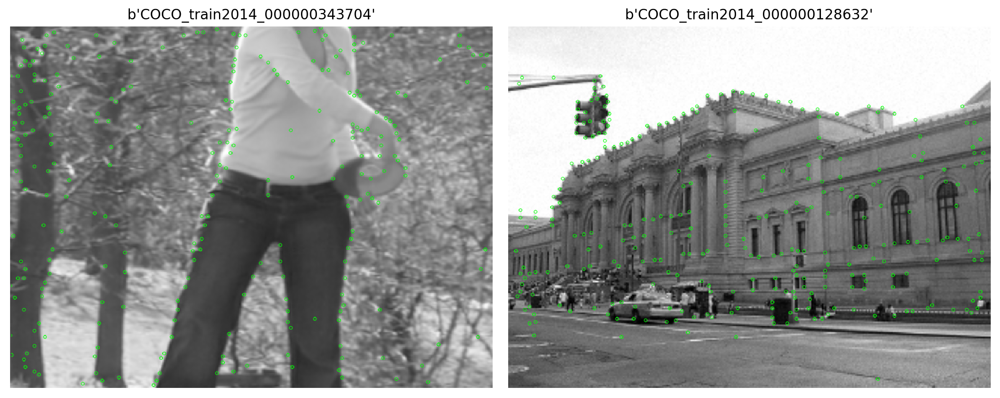

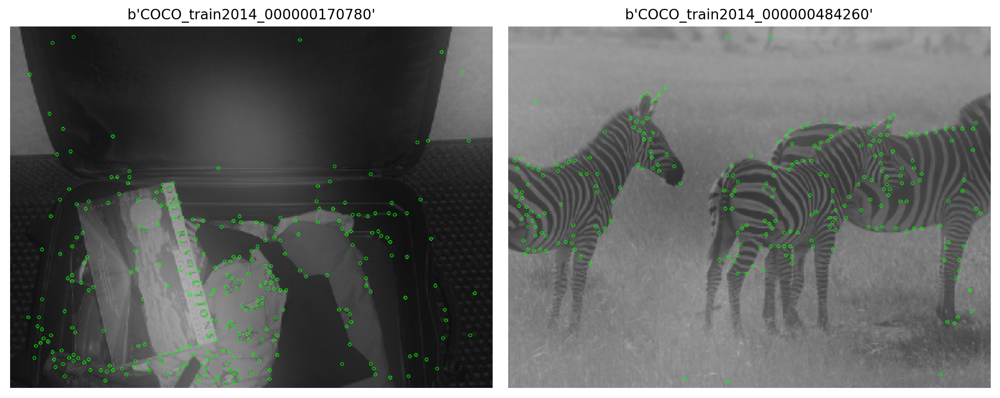

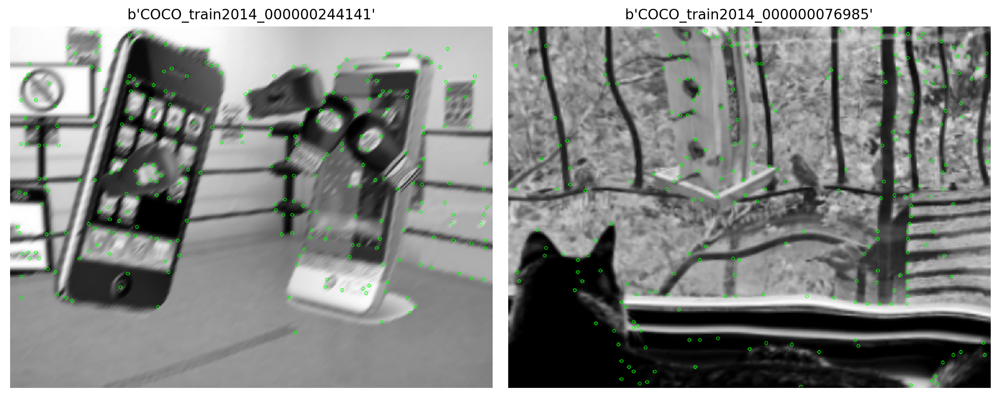

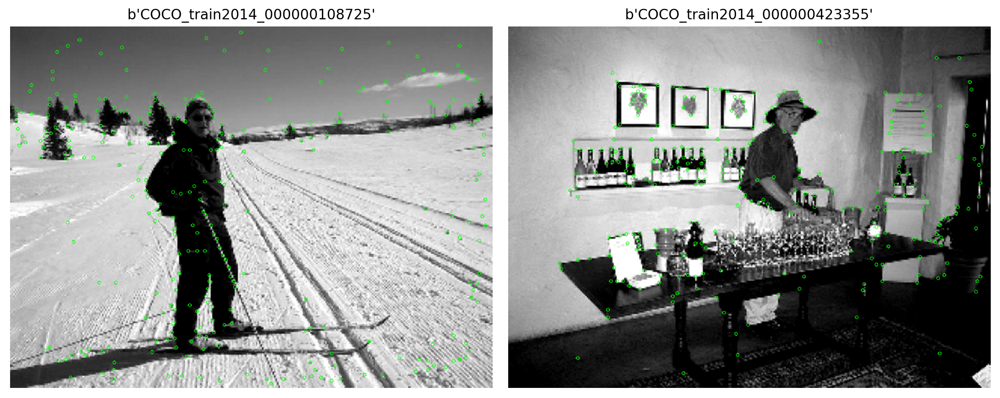

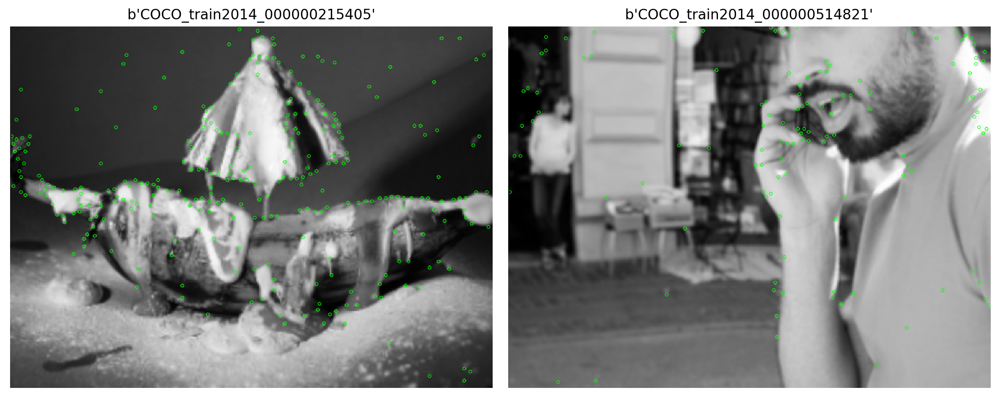

In [127]:
for i in range(15):
    images, names = [], []
    for _ in range(2):
        d = next(data)
        images.append(display(d)/255.)
        names.append(d['name'])
    plot_imgs(images, titles=names, dpi=200, cmap='gray')